In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import tensorflow as tf
import seaborn as sns
import pandas as pd
from collections import Counter
from PIL import Image
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report

In [ ]:
# Define the path to the training dataset for flower classification
dataset_directory = "/content/drive/MyDrive/AI Level 6/Flower Classification/Train"

In [ ]:
# Calculate the total count of images in the dataset
image_count_total = 0
for directory, subdirs, filenames in os.walk(dataset_directory):
    # Sum the number of files in each subdirectory
    file_count = len(filenames)
    image_count_total += file_count
print("Total images in dataset:", image_count_total)

# Tally images for each class
class_names = os.listdir(dataset_directory)
class_image_counts = {}
for category in class_names:
    category_path = os.path.join(dataset_directory, category)
    if os.path.isdir(category_path):
        class_image_counts[category] = len(os.listdir(category_path))
print("Images per class:", class_image_counts)

Total images in dataset: 4277
Images per class: {'sunflower': 725, 'dandelion': 1044, 'rose': 776, 'tulip': 976, 'daisy': 756}


In [ ]:
from PIL import Image, UnidentifiedImageError
import os

# List to store paths of corrupted images
invalid_image_paths = []

for category in class_names:
    category_directory = os.path.join(dataset_directory, category)
    print(f"Scanning directory: {category_directory}")

    if os.path.isdir(category_directory):
        image_files = os.listdir(category_directory)
        for image_filename in image_files:
            image_path = os.path.join(category_directory, image_filename)
            try:
                with Image.open(image_path) as image:
                    image.verify()
            except (IOError, UnidentifiedImageError):
                invalid_image_paths.append(image_path)
                print(f"Found corrupted image: {image_path}")
                try:
                    os.remove(image_path)
                    print(f"Removed: {image_path}")
                except Exception as error:
                    print(f"Could not remove {image_path}: {error}")

# Display summary of corrupted images
if invalid_image_paths:
    print(f"\nTotal invalid images removed: {len(invalid_image_paths)}")
else:
    print("\nAll images are valid.")

Scanning directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Train/sunflower
Scanning directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Train/dandelion
Scanning directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Train/rose
Scanning directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Train/tulip
Scanning directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Train/daisy

All images are valid.


In [ ]:
from collections import Counter
from PIL import Image

def summarize_image_dimensions(dataset_path):
    # Collect dimensions of all images
    dimensions = []
    for category in os.listdir(dataset_path):
        category_path = os.path.join(dataset_path, category)
        for image_filename in os.listdir(category_path):
            image_path = os.path.join(category_path, image_filename)
            try:
                with Image.open(image_path) as image:
                    dimensions.append(image.size)
            except:
                continue
    # Count frequency of each dimension
    dimension_frequencies = Counter(dimensions)
    print("Image dimensions and their counts:")
    for dim, freq in dimension_frequencies.items():
        print(f"{dim}: {freq} images")

summarize_image_dimensions(dataset_directory)

Image dimensions and their counts:
(180, 240): 153 images
(500, 335): 27 images
(500, 330): 6 images
(320, 240): 595 images
(320, 214): 12 images
(320, 212): 44 images
(320, 277): 5 images
(159, 240): 139 images
(240, 195): 2 images
(500, 332): 118 images
(320, 232): 9 images
(213, 240): 1 images
(240, 231): 2 images
(240, 234): 4 images
(320, 229): 13 images
(500, 375): 121 images
(320, 234): 10 images
(201, 240): 2 images
(240, 222): 2 images
(500, 333): 597 images
(240, 159): 373 images
(320, 213): 320 images
(194, 240): 3 images
(209, 240): 2 images
(500, 331): 54 images
(320, 239): 18 images
(240, 180): 67 images
(320, 238): 20 images
(320, 228): 20 images
(240, 240): 217 images
(320, 223): 4 images
(320, 252): 10 images
(500, 292): 5 images
(500, 348): 2 images
(500, 281): 48 images
(320, 249): 6 images
(320, 271): 2 images
(320, 226): 4 images
(386, 320): 1 images
(320, 251): 4 images
(229, 240): 2 images
(320, 253): 3 images
(320, 220): 8 images
(240, 210): 2 images
(170, 240):


Recommended resize dimensions: (338, 253)


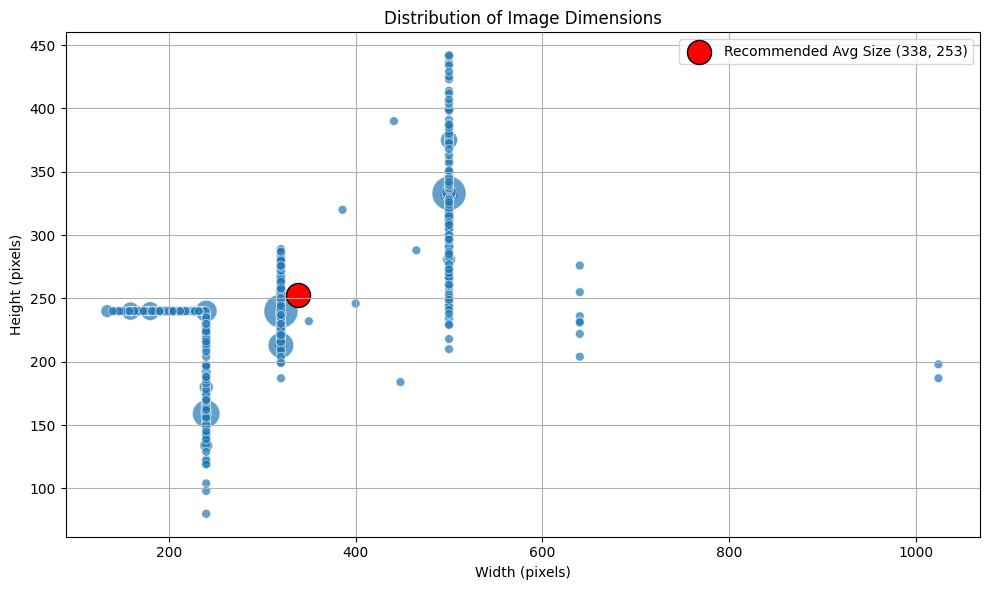

In [ ]:
# Step 1: Collect image dimensions
def collect_image_dimensions(dataset_path):
    # Store image dimensions
    dimensions = []
    for category in os.listdir(dataset_path):
        category_path = os.path.join(dataset_path, category)
        if os.path.isdir(category_path):
            for image_filename in os.listdir(category_path):
                image_path = os.path.join(category_path, image_filename)
                try:
                    with Image.open(image_path) as image:
                        dimensions.append(image.size)  # (width, height)
                except:
                    continue
    return Counter(dimensions)

# Step 2: Analyze dimensions and create visualization
def visualize_dimension_distribution(dataset_path):
    dimension_frequencies = collect_image_dimensions(dataset_path)

    if not dimension_frequencies:
        print("No valid image dimensions detected.")
        return

    # Convert to DataFrame for analysis
    records = []
    for (width, height), frequency in dimension_frequencies.items():
        records.append([width, height, frequency])
    dimension_df = pd.DataFrame(records, columns=["width", "height", "frequency"])

    # Compute weighted average dimensions
    total_images = dimension_df["frequency"].sum()
    average_width = int((dimension_df["width"] * dimension_df["frequency"]).sum() / total_images)
    average_height = int((dimension_df["height"] * dimension_df["frequency"]).sum() / total_images)
    print(f"\nRecommended resize dimensions: ({average_width}, {average_height})")

    # Visualize: Scatter plot of dimensions
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=dimension_df, x="width", y="height", size="frequency",
                    sizes=(40, 600), alpha=0.7, legend=False)
    plt.scatter(average_width, average_height, color='red', s=300, edgecolors='black',
                label=f"Recommended Avg Size ({average_width}, {average_height})")
    plt.title("Distribution of Image Dimensions")
    plt.xlabel("Width (pixels)")
    plt.ylabel("Height (pixels)")
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

visualize_dimension_distribution(dataset_directory)

In [ ]:
import shutil
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# Define dataset paths
source_dataset_dir = '/content/drive/MyDrive/AI Level 6/Flower Classification/Train'
processed_base_dir = '/content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset'
training_output_dir = os.path.join(processed_base_dir, 'training')
testing_output_dir = os.path.join(processed_base_dir, 'testing')

# Set target dimensions for resizing
resize_dimensions = (300, 300)

# Create output directories if they don't exist
for directory in [training_output_dir, testing_output_dir]:
    os.makedirs(directory, exist_ok=True)

# Process each category folder
for category in os.listdir(source_dataset_dir):
    category_path = os.path.join(source_dataset_dir, category)
    if not os.path.isdir(category_path):
        continue

    # Gather paths of all image files
    image_file_paths = [os.path.join(category_path, filename) for filename in os.listdir(category_path)
                        if filename.lower().endswith(('.jpg', '.jpeg', '.png'))]

    # Split images into training and testing sets (90% training, 10% testing)
    training_images, testing_images = train_test_split(image_file_paths, test_size=0.1, random_state=42)

    # Create category subdirectories in training and testing folders
    training_category_dir = os.path.join(training_output_dir, category)
    testing_category_dir = os.path.join(testing_output_dir, category)
    os.makedirs(training_category_dir, exist_ok=True)
    os.makedirs(testing_category_dir, exist_ok=True)

    # Resize and save training images
    for image_path in tqdm(training_images, desc=f'Processing training {category}'):
        try:
            image = Image.open(image_path).convert('RGB')
            resized_image = image.resize(resize_dimensions)
            resized_image.save(os.path.join(training_category_dir, os.path.basename(image_path)))
        except Exception as error:
            print(f"Failed to process {image_path}: {error}")

    # Resize and save testing images
    for image_path in tqdm(testing_images, desc=f'Processing testing {category}'):
        try:
            image = Image.open(image_path).convert('RGB')
            resized_image = image.resize(resize_dimensions)
            resized_image.save(os.path.join(testing_category_dir, os.path.basename(image_path)))
        except Exception as error:
            print(f"Failed to process {image_path}: {error}")

print("\nDataset has been processed, resized, and split into training and testing sets.")
print(f"Training directory: {training_output_dir}")
print(f"Testing directory: {testing_output_dir}")

Processing testing daisy: 100%|██████████| 76/76 [00:01<00:00, 72.98it/s]


Dataset has been processed, resized, and split into training and testing sets.
Training directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/training
Testing directory: /content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/testing


In [ ]:
# Path to the resized testing dataset
testing_dataset_dir = "/content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/testing"

# Calculate the total number of images in the testing dataset
total_image_count = 0
for directory, subdirs, filenames in os.walk(testing_dataset_dir):
    # Sum the number of files in each subdirectory
    file_count = len(filenames)
    total_image_count += file_count
print("Total images in testing dataset:", total_image_count)

# Count images per category
category_names = os.listdir(testing_dataset_dir)
category_image_counts = {}
for category in category_names:
    category_path = os.path.join(testing_dataset_dir, category)
    if os.path.isdir(category_path):
        category_image_counts[category] = len(os.listdir(category_path))
print("Images per category:", category_image_counts)

Total images in testing dataset: 430
Images per category: {'sunflower': 73, 'dandelion': 105, 'rose': 78, 'tulip': 98, 'daisy': 76}


In [ ]:
# Path to the resized training dataset
training_dataset_dir = "/content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/training"

# Calculate the total number of images in the training dataset
total_image_count = 0
for directory, subdirs, filenames in os.walk(training_dataset_dir):
    # Sum the number of files in each subdirectory
    file_count = len(filenames)
    total_image_count += file_count
print("Total images in training dataset:", total_image_count)

# Count images per category
category_names = os.listdir(training_dataset_dir)
category_image_counts = {}
for category in category_names:
    category_path = os.path.join(training_dataset_dir, category)
    if os.path.isdir(category_path):
        category_image_counts[category] = len(os.listdir(category_path))
print("Images per category:", category_image_counts)

Total images in training dataset: 3847
Images per category: {'sunflower': 652, 'dandelion': 939, 'rose': 698, 'tulip': 878, 'daisy': 680}


In [ ]:
# Specify the directory containing the training images
training_dataset = tf.keras.utils.image_dataset_from_directory(
    training_dataset_dir,
    batch_size=32,
    image_size=(300, 300),
    shuffle=True,
    seed=123,
    validation_split=0.2,
    subset="training",
)

Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [ ]:
# Specify the directory containing the validation images
validation_dataset = tf.keras.utils.image_dataset_from_directory(
    training_dataset_dir,
    batch_size=32,
    image_size=(300, 300),
    shuffle=True,
    seed=123,
    validation_split=0.2,
    subset="validation",
)

Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [ ]:
# Define image augmentation pipeline
image_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])

In [ ]:
# Retrieve and display category names from the training dataset
category_names = sorted(os.listdir(training_dataset_dir))
if not category_names:
    print("No category directories found in the training folder!")
else:
    print(f"Found {len(category_names)} categories: {category_names}")

Found 5 categories: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']


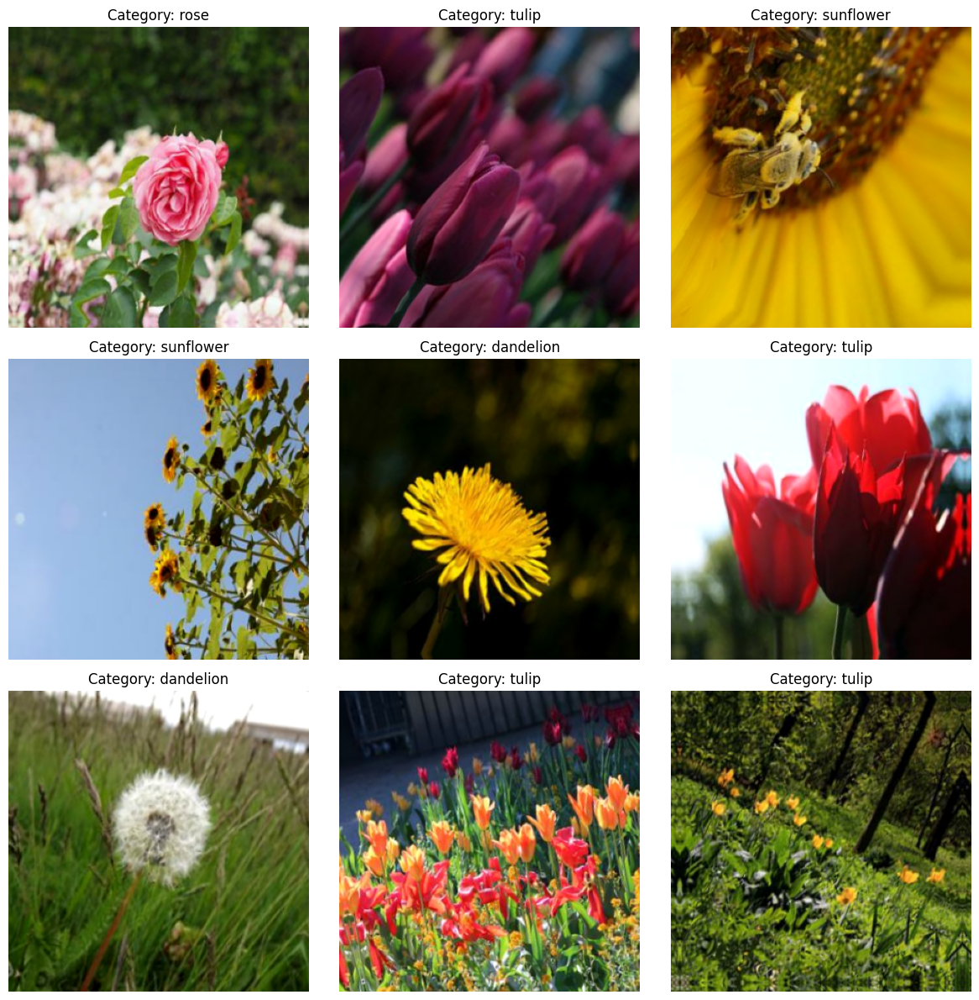

In [ ]:
# Visualize a sample of augmented images from the dataset
def display_augmented_images(dataset, image_augmentation, category_names):
    plt.figure(figsize=(12, 12))

    for images, labels in dataset.take(1):
        augmented_images = image_augmentation(images)

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(augmented_images[i].numpy().astype("uint8"))
            plt.title(f"Category: {category_names[labels[i].numpy()]}")
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Display augmented images from the training dataset
display_augmented_images(training_dataset, image_augmentation, category_names)

<ipython-input-16-3d3be5b2581c>:23: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=data["Category"], y=data["Image Count"], palette="Set2")


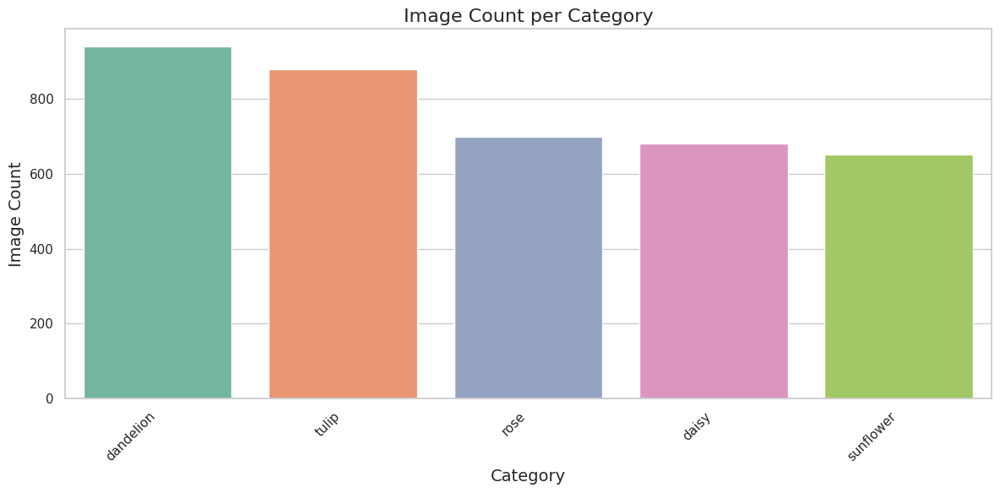

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the distribution of images across categories
def visualize_category_image_distribution(dataset_path):
    category_counts = []

    for category in os.listdir(dataset_path):
        category_path = os.path.join(dataset_path, category)
        if os.path.isdir(category_path):
            image_count = len([filename for filename in os.listdir(category_path) if filename.lower().endswith('.jpg')])
            category_counts.append((category, image_count))

    category_counts.sort(key=lambda x: x[1], reverse=True)

    category_names, image_counts = zip(*category_counts)

    data = {"Category": category_names, "Image Count": image_counts}

    sns.set(style="whitegrid", palette="muted")

    plt.figure(figsize=(12, 6))
    sns.barplot(x=data["Category"], y=data["Image Count"], palette="Set2")

    plt.xticks(rotation=45, ha="right")

    plt.title("Image Count per Category", fontsize=16)
    plt.xlabel("Category", fontsize=14)
    plt.ylabel("Image Count", fontsize=14)

    plt.tight_layout()
    plt.show()

# Display the image distribution for the training dataset
visualize_category_image_distribution(training_dataset_dir)

Building The Model


In [ ]:
# Define a function to create a convolutional neural network model
def build_cnn_model(height, width, channels, class_count):
    # Initialize the sequential model
    flower_classifier = tf.keras.Sequential([
        # Apply image augmentation
        image_augmentation,

        # Normalize pixel values to [0,1]
        layers.Rescaling(1./255, input_shape=(height, width, channels)),

        # First convolutional block
        layers.Conv2D(32, (3,3), padding="same", activation="relu"),
        layers.MaxPooling2D(2,2),

        # Second convolutional block
        layers.Conv2D(64, (3,3), padding="same", activation="relu"),
        layers.MaxPooling2D(2,2),

        # Third convolutional block
        layers.Conv2D(128, (3,3), padding="same", activation="relu"),
        layers.MaxPooling2D(2,2),

        # Fully connected layers for classification
        layers.Flatten(),
        layers.Dense(128, activation="relu"),
        layers.Dense(64, activation="relu"),
        layers.Dense(32, activation="relu"),
        layers.Dense(class_count, activation="softmax")
    ])
    return flower_classifier

In [ ]:
# Define hyperparameters for the model
batch_size = 32
image_height = 300
image_width = 300
dropout_factor = 0.2

# Calculate the number of categories
category_count = len(category_names)

# Build the convolutional neural network model
flower_cnn = build_cnn_model(image_height, image_width, 3, category_count)

# Convert labels to one-hot encoded format for training and validation datasets
training_dataset = training_dataset.map(lambda image, label: (image, tf.one_hot(label, depth=5)))
validation_dataset = validation_dataset.map(lambda image, label: (image, tf.one_hot(label, depth=5)))

# Configure the model for training
flower_cnn.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy"]
)

# Display the model architecture
flower_cnn.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (32, 175232)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (32, 128)              │    22,429,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (32, 64)               │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (32, 32)               │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (32, 5)                │           165 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,533,573 (85.96 MB)

 Trainable params: 22,533,573 (85.96 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
# Define callbacks for model training
training_callbacks = [
    keras.callbacks.ModelCheckpoint(filepath="checkpoint_epoch_{epoch}.keras"),
    keras.callbacks.EarlyStopping(monitor="val_loss", patience=5),
]

In [ ]:
# Set the number of training epochs
training_epochs = 30

# Train the convolutional neural network
training_history = flower_cnn.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=training_epochs,
    callbacks=training_callbacks
)

Epoch 1/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - accuracy: 0.3476 - loss: 1.5399 - val_accuracy: 0.5813 - val_loss: 1.0978
Epoch 2/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 18s 175ms/step - accuracy: 0.5449 - loss: 1.1164 - val_accuracy: 0.6151 - val_loss: 0.9984
Epoch 3/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 18s 150ms/step - accuracy: 0.6236 - loss: 0.9705 - val_accuracy: 0.6515 - val_loss: 0.9151
Epoch 4/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 22s 169ms/step - accuracy: 0.6333 - loss: 0.9479 - val_accuracy: 0.6593 - val_loss: 0.9127
Epoch 5/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 23s 190ms/step - accuracy: 0.6555 - loss: 0.8965 - val_accuracy: 0.5683 - val_loss: 1.1658
Epoch 6/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 191ms/step - accuracy: 0.6649 - loss: 0.8697 - val_accuracy: 0.6957 - val_loss: 0.8431
Epoch 7/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - accuracy: 0.6932 - loss: 0.7862 - val_accuracy: 0.7256 - val_loss: 0.7963
Epoch 8/30
97/97 ━━━━━━━━━━━━━━━━━━━━ 18s 187ms/step - accuracy: 0.7212 - loss: 0.7372 - val_accu

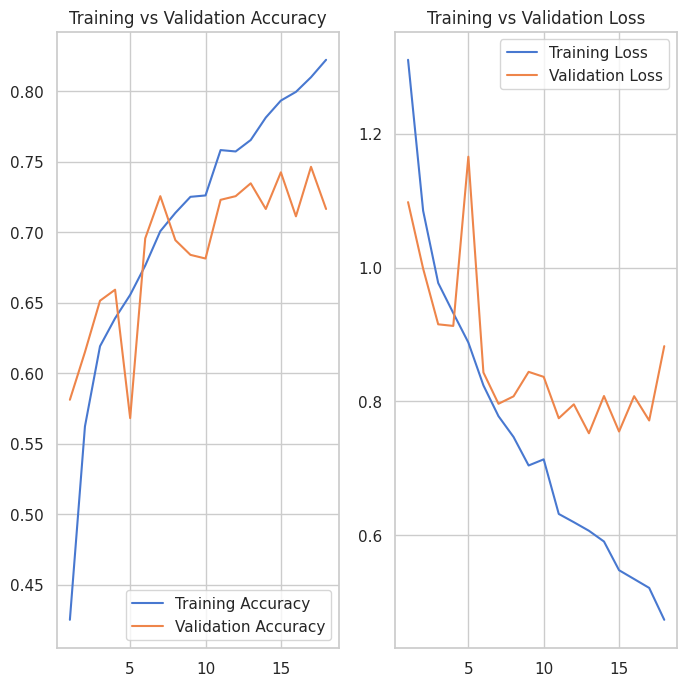

In [ ]:
# Extract training and validation metrics from the training history
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']

training_loss = training_history.history['loss']
validation_loss = training_history.history['val_loss']

# Define the range of epochs based on the number of completed epochs
epoch_range = range(1, len(training_accuracy) + 1)

# Create a figure to visualize training and validation metrics
plt.figure(figsize=(8, 8))

# Plot accuracy metrics
plt.subplot(1, 2, 1)
plt.plot(epoch_range, training_accuracy, label='Training Accuracy')
plt.plot(epoch_range, validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training vs Validation Accuracy')

# Plot loss metrics
plt.subplot(1, 2, 2)
plt.plot(epoch_range, training_loss, label='Training Loss')
plt.plot(epoch_range, validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training vs Validation Loss')

# Display the plots
plt.show()

In [ ]:
# Evaluate the model on the validation dataset
validation_loss, validation_accuracy = flower_cnn.evaluate(validation_dataset)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 108ms/step - accuracy: 0.7174 - loss: 0.8987
Validation Loss: 0.8824632167816162
Validation Accuracy: 0.7165149450302124


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 2s 108ms/step - accuracy: 0.7104 - loss: 0.9062
Test Loss: 0.921116292476654
Test Accuracy: 0.7209302186965942
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 169ms/step


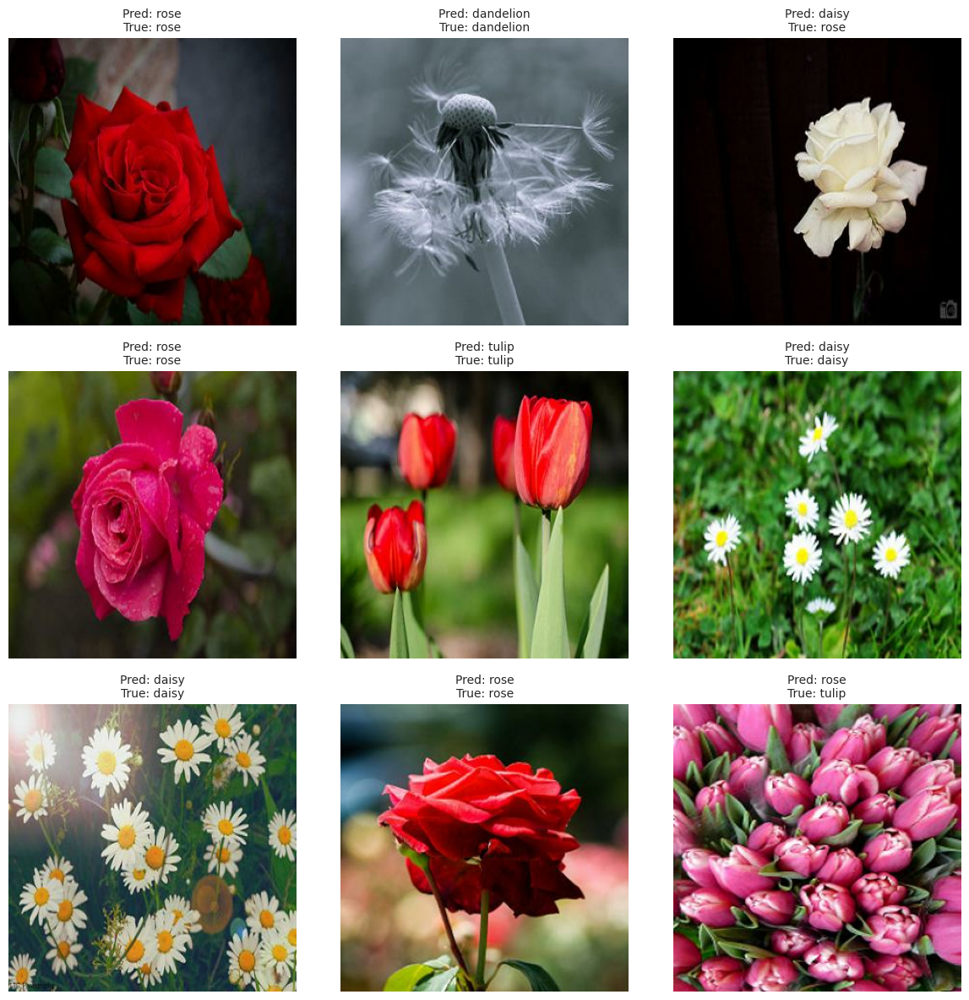

In [ ]:
# Function to predict and display classification results
def show_prediction_results(model, dataset, class_names):
    # Set up a figure for visualizing predictions
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Obtain predicted probabilities for the image batch
        prediction_outputs = model.predict(images)
        image_data = images.numpy()  # Convert images to NumPy arrays
        label_data = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(image_data[i].astype("uint8"))

            # Identify the predicted class
            predicted_class_name = class_names[np.argmax(prediction_outputs[i])]

            # Retrieve the true class from one-hot encoded labels
            true_class_idx = np.argmax(label_data[i])
            true_class_name = class_names[true_class_idx]

            # Display predicted and true class names
            plt.title(f"Pred: {predicted_class_name}\nTrue: {true_class_name}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Define class names from the training dataset directory
training_dataset_dir = "/content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/training"
class_names = sorted(os.listdir(training_dataset_dir))

# Specify the path to the test dataset directory
test_dataset_path = "/content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/testing"

# Load the test dataset
test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dataset_path,
    batch_size=32,
    image_size=(300, 300),
    shuffle=True
)

# Convert test dataset labels to one-hot encoded format
test_dataset = test_dataset.map(lambda image, label: (image, tf.one_hot(label, depth=len(class_names))))

# Evaluate the model performance on the test dataset
test_loss_value, test_accuracy_value = flower_cnn.evaluate(test_dataset)
print("Test Loss:", test_loss_value)
print("Test Accuracy:", test_accuracy_value)

# Visualize predictions for the test dataset
show_prediction_results(flower_cnn, test_dataset, class_names)

In [ ]:
# Save the trained model to a file
flower_cnn.save('2329462_SabinShrestha_CNN.h5')

In [ ]:
# Load the saved convolutional neural network model
flower_classifier = keras.models.load_model('2329462_SabinShrestha_CNN.h5')
print("Flower classification model loaded")

# Gather test images and their labels
collected_images = []
collected_labels = []
for images, labels in test_dataset:
    collected_images.append(images.numpy())
    collected_labels.append(labels.numpy())

# Merge batches into single arrays
merged_test_images = np.concatenate(collected_images, axis=0)  # Shape: (num_samples, 300, 300, 3)
merged_test_labels_onehot = np.concatenate(collected_labels, axis=0)  # Shape: (num_samples, num_classes)

# Generate predictions using the model
prediction_outputs = flower_classifier.predict(merged_test_images)
predicted_class_indices = np.argmax(prediction_outputs, axis=1)
actual_class_indices = merged_test_labels_onehot
if actual_class_indices.ndim > 1:
    actual_class_indices = np.argmax(actual_class_indices, axis=1)

# Output the category names
print(f"Category names: {class_names}")

# Create and display the classification report
performance_report = classification_report(actual_class_indices, predicted_class_indices, target_names=class_names)
print("Classification Report:\n", performance_report)

Flower classification model loaded
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 48ms/step
Category names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Report:
               precision    recall  f1-score   support

       daisy       0.83      0.71      0.77        76
   dandelion       0.87      0.75      0.81       105
        rose       0.61      0.67      0.64        78
   sunflower       0.64      0.95      0.76        73
       tulip       0.69      0.57      0.63        98

    accuracy                           0.72       430
   macro avg       0.73      0.73      0.72       430
weighted avg       0.74      0.72      0.72       430



Regularized Model

In [ ]:

# Define a function to build a regularized convolutional neural network
def create_flower_cnn(height, width, channels, class_count):
    enhanced_classifier = tf.keras.Sequential([
        # Apply image augmentation pipeline
        image_augmentation,

        # Normalize pixel values to [0,1]
        layers.Rescaling(1./255, input_shape=(height, width, channels)),

        # First convolutional block with regularization
        layers.Conv2D(32, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(2,2),
        layers.Dropout(0.2),

        # Second convolutional block with regularization
        layers.Conv2D(64, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(2,2),
        layers.Dropout(0.2),

        # Third convolutional block with regularization
        layers.Conv2D(128, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(2,2),
        layers.Dropout(0.2),

        # Fourth convolutional block with regularization
        layers.Conv2D(256, (3,3), padding="same", activation="relu"),
        layers.BatchNormalization(),
        layers.MaxPooling2D(2,2),
        layers.Dropout(0.2),

        # Fully connected layers for classification
        layers.Flatten(),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dense(128, activation="relu"),
        layers.BatchNormalization(),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(class_count, activation='softmax')
    ])
    return enhanced_classifier

In [ ]:
# Determine the number of categories
category_count = len(class_names)

# Create the enhanced convolutional neural network model
flower_cnn_enhanced = create_flower_cnn(image_height, image_width, 3, category_count)

# Configure the model for training with SGD optimizer
flower_cnn_enhanced.compile(
    loss="categorical_crossentropy",
    optimizer="sgd",
    metrics=["accuracy"]
)

# Display the model architecture summary
flower_cnn_enhanced.summary()

/usr/local/lib/python3.11/dist-packages/keras/src/layers/preprocessing/tf_data_layer.py:19: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
# Set the number of training iterations
training_epochs = 50

# Train the enhanced convolutional neural network
training_history = flower_cnn_enhanced.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=training_epochs,
    callbacks=[training_callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 32s 326ms/step - accuracy: 0.4602 - loss: 1.3662 - val_accuracy: 0.2380 - val_loss: 3.6723
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 318ms/step - accuracy: 0.5450 - loss: 1.1457 - val_accuracy: 0.2380 - val_loss: 3.6269
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 323ms/step - accuracy: 0.5743 - loss: 1.0634 - val_accuracy: 0.2185 - val_loss: 3.2042
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 320ms/step - accuracy: 0.5856 - loss: 1.0291 - val_accuracy: 0.2354 - val_loss: 2.8771
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 31s 318ms/step - accuracy: 0.6111 - loss: 0.9943 - val_accuracy: 0.2237 - val_loss: 2.8696
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 30s 313ms/step - accuracy: 0.6354 - loss: 0.9357 - val_accuracy: 0.3719 - val_loss: 2.1674
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 42s 320ms/step - accuracy: 0.6449 - loss: 0.9132 - val_accuracy: 0.4005 - val_loss: 2.3223
Epoch 8/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 34s 346ms/step - accuracy: 0.6749 - loss: 0.8667 - val_accu

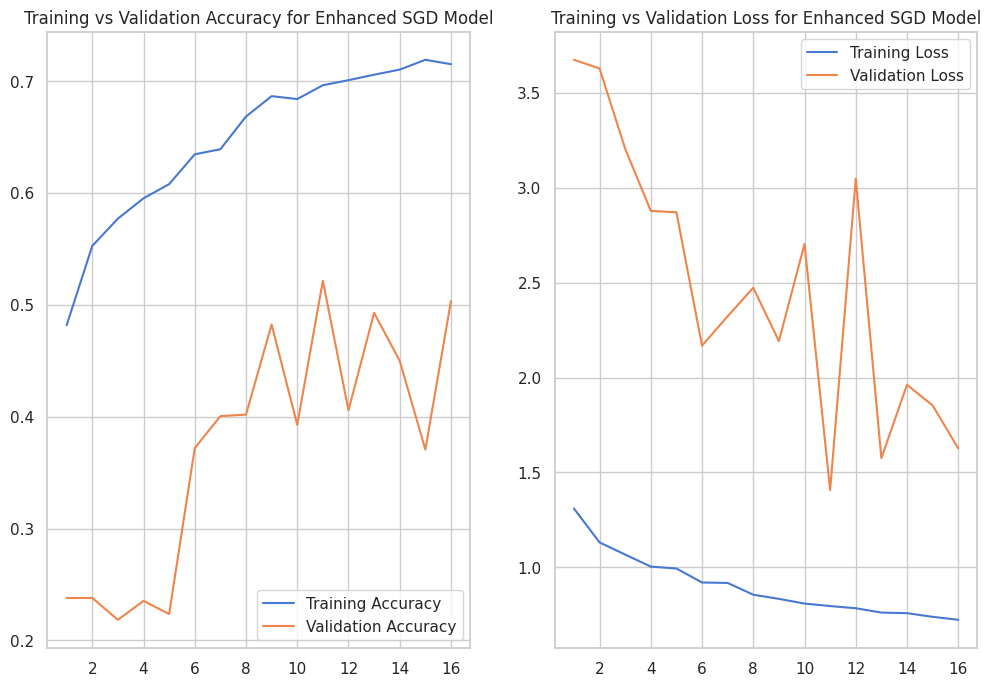

In [ ]:
# Extract accuracy and loss metrics from training history
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']
training_loss = training_history.history['loss']
validation_loss = training_history.history['val_loss']

# Define the range of epochs based on completed training
epoch_range = range(1, len(training_accuracy) + 1)

# Create a figure to visualize training metrics
plt.figure(figsize=(12, 8))

# Plot accuracy metrics
plt.subplot(1, 2, 1)
plt.plot(epoch_range, training_accuracy, label='Training Accuracy')
plt.plot(epoch_range, validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training vs Validation Accuracy for Enhanced SGD Model')

# Plot loss metrics
plt.subplot(1, 2, 2)
plt.plot(epoch_range, training_loss, label='Training Loss')
plt.plot(epoch_range, validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training vs Validation Loss for Enhanced SGD Model')

# Display the visualization
plt.show()

In [ ]:
# Assess the model performance on the validation dataset
validation_loss, validation_accuracy = flower_cnn_enhanced.evaluate(validation_dataset)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 88ms/step - accuracy: 0.4956 - loss: 1.5904
Validation Loss: 1.6272475719451904
Validation Accuracy: 0.5032509565353394


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step - accuracy: 0.5245 - loss: 1.3339
Test Loss: 1.4048755168914795
Test Accuracy: 0.5348837375640869
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 417ms/step


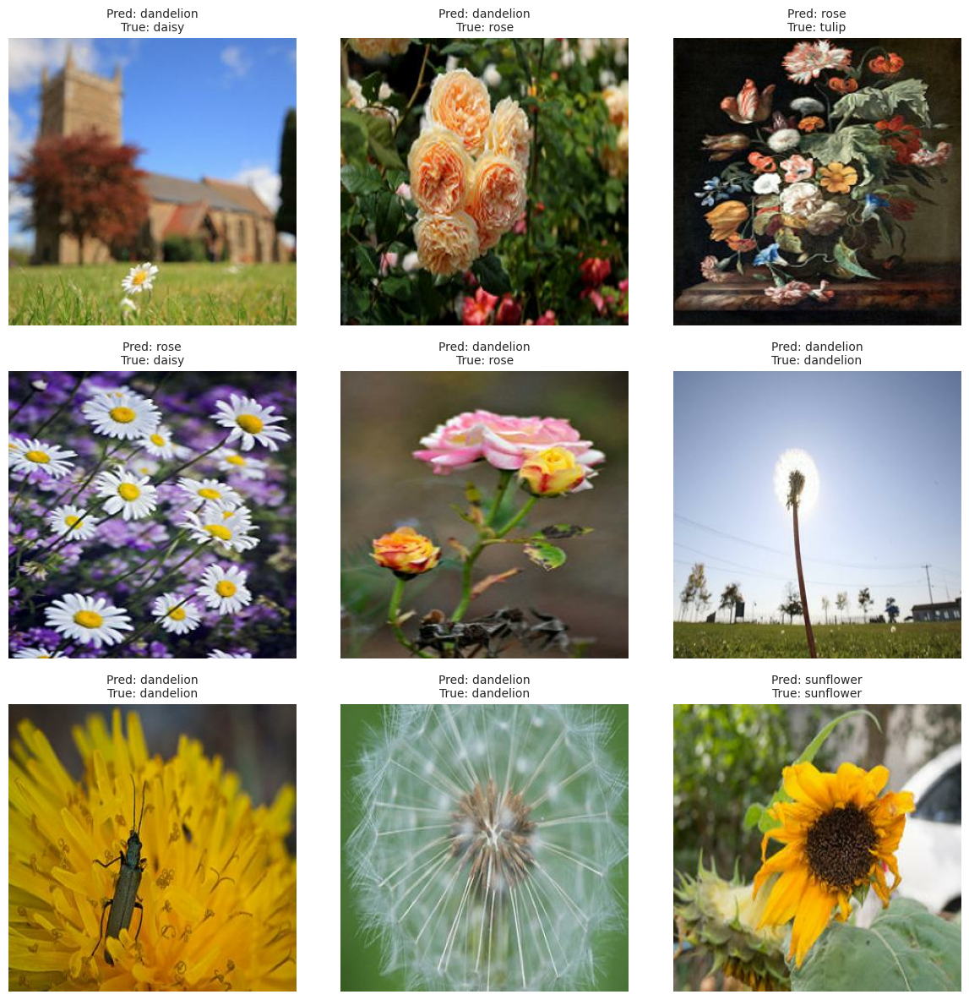

In [ ]:
# Define a function to predict and visualize classification results
def display_prediction_results(model, dataset, category_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Generate predictions for the batch of images
        prediction_outputs = model.predict(images)
        image_data = images.numpy()  # Convert images to NumPy arrays
        label_data = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(image_data[i].astype("uint8"))

            # Identify the predicted category
            predicted_category = category_names[np.argmax(prediction_outputs[i])]

            # Convert one-hot encoded label to category index
            true_category_index = np.argmax(label_data[i])
            true_category = category_names[true_category_index]

            # Display predicted and true categories
            plt.title(f"Pred: {predicted_category}\nTrue: {true_category}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Evaluate the model performance on the test dataset
test_loss_value, test_accuracy_value = flower_cnn_enhanced.evaluate(test_dataset)
print("Test Loss:", test_loss_value)
print("Test Accuracy:", test_accuracy_value)

# Visualize predictions for a sample of test images
display_prediction_results(flower_cnn_enhanced, test_dataset, class_names)

In [ ]:
# Save the enhanced convolutional neural network model
flower_cnn_enhanced.save('2329462_SabinShrestha_CNN_SGD.h5')

In [ ]:
# Load the saved model for predictions
loaded_flower_classifier = keras.models.load_model('2329462_SabinShrestha_CNN_SGD.h5')
print("Flower classification model loaded for predictions")

# Gather all test images and their labels
collected_images = []
collected_labels = []
for images, labels in test_dataset:
    collected_images.append(images.numpy())
    collected_labels.append(labels.numpy())

# Merge batches into single arrays
merged_test_images = np.concatenate(collected_images, axis=0)  # Shape: (num_samples, 300, 300, 3)
merged_test_labels_onehot = np.concatenate(collected_labels, axis=0)  # Shape: (num_samples, num_classes)

# Generate predictions using the loaded model
prediction_outputs = loaded_flower_classifier.predict(merged_test_images)
predicted_class_indices = np.argmax(prediction_outputs, axis=1)
actual_class_indices = merged_test_labels_onehot
if actual_class_indices.ndim > 1:
    actual_class_indices = np.argmax(actual_class_indices, axis=1)

# Output the category names
print(f"Category names: {class_names}")

# Create and display the classification performance report
performance_report = classification_report(actual_class_indices, predicted_class_indices, target_names=class_names)
print("Classification Performance Report:\n", performance_report)

Flower classification model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step
Category names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Performance Report:
               precision    recall  f1-score   support

       daisy       0.62      0.26      0.37        76
   dandelion       0.41      0.87      0.56       105
        rose       0.49      0.49      0.49        78
   sunflower       0.92      0.49      0.64        73
       tulip       0.75      0.46      0.57        98

    accuracy                           0.53       430
   macro avg       0.64      0.51      0.53       430
weighted avg       0.63      0.53      0.53       430



In [ ]:
# Configure the enhanced model for training with Adam optimizer
flower_cnn_enhanced.compile(
    loss="categorical_crossentropy",
    optimizer="adam",
    metrics=["accuracy"]
)

# Display the architecture of the enhanced model
flower_cnn_enhanced.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ sequential (Sequential)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling_1 (Rescaling)         │ (32, 300, 300, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (32, 300, 300, 32)     │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (32, 300, 300, 32)     │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (32, 150, 150, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (32, 150, 150, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (32, 150, 150, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (32, 75, 75, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (32, 75, 75, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (32, 75, 75, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (32, 37, 37, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (32, 37, 37, 256)      │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (32, 37, 37, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (32, 18, 18, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (32, 82944)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (32, 256)              │    21,233,920 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (32, 256)              │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (32, 128)              │        32,896 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 21,667,269 (82.65 MB)

 Trainable params: 21,665,541 (82.65 MB)

 Non-trainable params: 1,728 (6.75 KB)

In [ ]:
# Set the number of training iterations
training_epochs = 50

# Train the enhanced convolutional neural network
training_history = flower_cnn_enhanced.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=training_epochs,
    callbacks=[training_callbacks]
)

Epoch 1/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 42s 367ms/step - accuracy: 0.5074 - loss: 1.2328 - val_accuracy: 0.5514 - val_loss: 1.5678
Epoch 2/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 42s 381ms/step - accuracy: 0.5958 - loss: 1.0217 - val_accuracy: 0.5670 - val_loss: 1.3496
Epoch 3/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 39s 358ms/step - accuracy: 0.6212 - loss: 0.9466 - val_accuracy: 0.6255 - val_loss: 0.9719
Epoch 4/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 45s 403ms/step - accuracy: 0.6676 - loss: 0.8812 - val_accuracy: 0.5111 - val_loss: 1.6035
Epoch 5/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 39s 383ms/step - accuracy: 0.6866 - loss: 0.8311 - val_accuracy: 0.6606 - val_loss: 0.9160
Epoch 6/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 41s 382ms/step - accuracy: 0.6925 - loss: 0.8050 - val_accuracy: 0.6749 - val_loss: 0.8797
Epoch 7/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 37s 343ms/step - accuracy: 0.7140 - loss: 0.7631 - val_accuracy: 0.6060 - val_loss: 1.0719
Epoch 8/50
97/97 ━━━━━━━━━━━━━━━━━━━━ 47s 403ms/step - accuracy: 0.7387 - loss: 0.6817 - val_accu

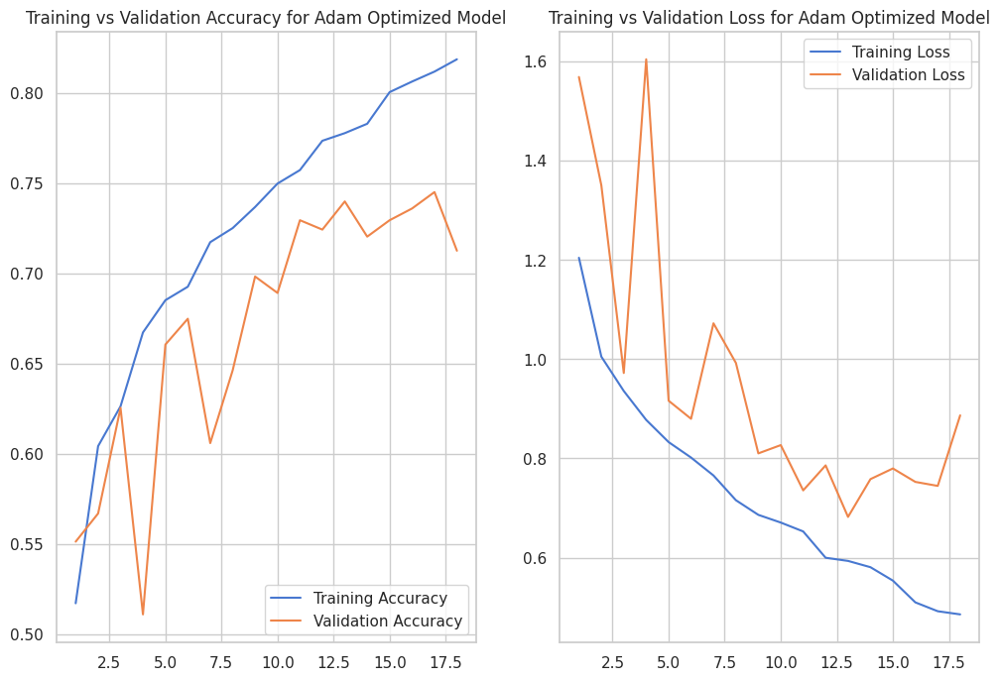

In [ ]:
# Retrieve accuracy and loss metrics from training history
training_accuracy = training_history.history['accuracy']
validation_accuracy = training_history.history['val_accuracy']
training_loss = training_history.history['loss']
validation_loss = training_history.history['val_loss']

# Define the epoch range based on training duration
epoch_range = range(1, len(training_accuracy) + 1)

# Initialize a figure for plotting training metrics
plt.figure(figsize=(12, 8))

# Plot training and validation accuracy
plt.subplot(1, 2, 1)
plt.plot(epoch_range, training_accuracy, label='Training Accuracy')
plt.plot(epoch_range, validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training vs Validation Accuracy for Adam Optimized Model')

# Plot training and validation loss
plt.subplot(1, 2, 2)
plt.plot(epoch_range, training_loss, label='Training Loss')
plt.plot(epoch_range, validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training vs Validation Loss for Adam Optimized Model')

# Render the plots
plt.show()

In [ ]:
# Evaluate the model on the validation dataset
validation_loss, validation_accuracy = flower_cnn_enhanced.evaluate(validation_dataset)
print("Validation Loss:", validation_loss)
print("Validation Accuracy:", validation_accuracy)


25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 89ms/step - accuracy: 0.7207 - loss: 0.9105
Validation Loss: 0.8865832686424255
Validation Accuracy: 0.7126137614250183


14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.6681 - loss: 1.0111
Test Loss: 0.9107360243797302
Test Accuracy: 0.699999988079071
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 314ms/step


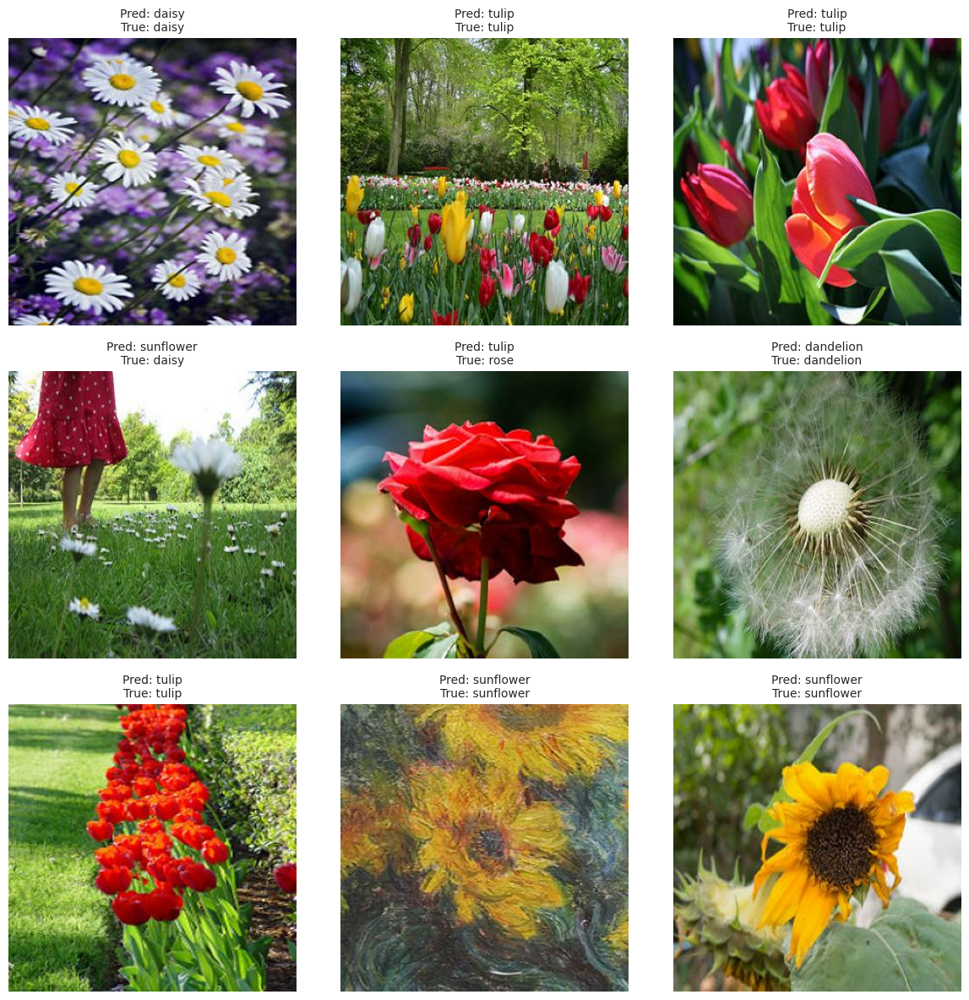

In [ ]:
# Define a function to visualize model predictions
def visualize_prediction_results(model, dataset, category_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Generate predictions for the image batch
        prediction_outputs = model.predict(images)
        image_data = images.numpy()  # Convert images to NumPy arrays
        label_data = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(image_data[i].astype("uint8"))

            # Determine the predicted category
            predicted_category = category_names[np.argmax(prediction_outputs[i])]

            # Extract the true category from one-hot encoded labels
            true_category_index = np.argmax(label_data[i])
            true_category = category_names[true_category_index]

            # Display predicted and true categories
            plt.title(f"Pred: {predicted_category}\nTrue: {true_category}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Evaluate the model on the test dataset
test_loss_value, test_accuracy_value = flower_cnn_enhanced.evaluate(test_dataset)
print("Test Loss:", test_loss_value)
print("Test Accuracy:", test_accuracy_value)

# Display predictions for a sample of test images
visualize_prediction_results(flower_cnn_enhanced, test_dataset, class_names)

In [ ]:
# Save the enhanced convolutional neural network model trained with Adam
flower_cnn_enhanced.save('2329462_SabinShrestha_CNN_ADAM.h5')

In [ ]:
# Load the saved model for prediction tasks
loaded_flower_classifier = keras.models.load_model('2329462_SabinShrestha_CNN_ADAM.h5')
print("Adam-optimized flower classification model loaded")

# Collect all images and labels from the test dataset
test_image_collection = []
test_label_collection = []
for images, labels in test_dataset:
    test_image_collection.append(images.numpy())
    test_label_collection.append(labels.numpy())

# Combine batches into unified arrays
combined_test_images = np.concatenate(test_image_collection, axis=0)  # Shape: (num_samples, 300, 300, 3)
combined_test_labels_onehot = np.concatenate(test_label_collection, axis=0)  # Shape: (num_samples, num_classes)

# Predict classes using the loaded model
predicted_probabilities = loaded_flower_classifier.predict(combined_test_images)
predicted_class_indices = np.argmax(predicted_probabilities, axis=1)
actual_class_indices = combined_test_labels_onehot
if actual_class_indices.ndim > 1:
    actual_class_indices = np.argmax(actual_class_indices, axis=1)

# Display the list of category names
print(f"Category names: {class_names}")

# Produce and display the classification performance report
classification_metrics = classification_report(actual_class_indices, predicted_class_indices, target_names=class_names)
print("Classification Performance Report:\n", classification_metrics)

Adam-optimized flower classification model loaded
14/14 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step
Category names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Performance Report:
               precision    recall  f1-score   support

       daisy       0.83      0.63      0.72        76
   dandelion       0.69      0.83      0.75       105
        rose       0.76      0.45      0.56        78
   sunflower       0.57      0.96      0.71        73
       tulip       0.80      0.62      0.70        98

    accuracy                           0.70       430
   macro avg       0.73      0.70      0.69       430
weighted avg       0.73      0.70      0.69       430



Transfer Learning RESNET MODEL

In [ ]:
# Load the training dataset from the processed directory
training_dataset = tf.keras.utils.image_dataset_from_directory(
    training_dataset_dir,
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=123,
    validation_split=0.2,
    subset="training",
)

Found 3847 files belonging to 5 classes.
Using 3078 files for training.


In [ ]:
# Load the validation dataset from the processed directory
validation_dataset = tf.keras.utils.image_dataset_from_directory(
    training_dataset_dir,
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=123,
    validation_split=0.2,
    subset="validation",
)

Found 3847 files belonging to 5 classes.
Using 769 files for validation.


In [ ]:
# Convert labels to one-hot encoded format for training dataset
training_dataset = training_dataset.map(lambda image, label: (image, tf.one_hot(label, depth=5)))

# Convert labels to one-hot encoded format for validation dataset
validation_dataset = validation_dataset.map(lambda image, label: (image, tf.one_hot(label, depth=5)))

In [ ]:
from tensorflow.keras.applications import ResNet50
# Initialize a sequential model for transfer learning
flower_resnet_classifier = Sequential()

# Load pre-trained ResNet50 model without top layers
base_resnet_model = ResNet50(
    include_top=False,
    input_shape=(256, 256, 3),
    pooling='avg',
    classes=5,
    weights='imagenet'
)

# Freeze the pre-trained layers to prevent training
for layer in base_resnet_model.layers:
    layer.trainable = False

# Add the pre-trained ResNet50 model to the sequential model
flower_resnet_classifier.add(base_resnet_model)

# Add custom layers for classification
flower_resnet_classifier.add(layers.Flatten())
flower_resnet_classifier.add(layers.Dense(512, activation='relu'))
flower_resnet_classifier.add(layers.Dropout(0.5))
flower_resnet_classifier.add(layers.BatchNormalization())
flower_resnet_classifier.add(layers.Dense(5, activation='softmax'))

# Configure the model with Adam optimizer and categorical loss
flower_resnet_classifier.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Display the architecture of the ResNet-based model
flower_resnet_classifier.summary()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 2048)           │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 512)            │         2,048 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 5)              │         2,565 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 24,641,413 (94.00 MB)

 Trainable params: 1,052,677 (4.02 MB)

 Non-trainable params: 23,588,736 (89.98 MB)

In [ ]:
# Set the number of training iterations
training_epochs = 20

# Train the ResNet-based convolutional neural network
resnet_training_history = flower_resnet_classifier.fit(
    training_dataset,
    validation_data=validation_dataset,
    epochs=training_epochs
)

Epoch 1/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 45s 263ms/step - accuracy: 0.6949 - loss: 0.8316 - val_accuracy: 0.8388 - val_loss: 0.4471
Epoch 2/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 14s 141ms/step - accuracy: 0.8577 - loss: 0.3966 - val_accuracy: 0.8700 - val_loss: 0.3366
Epoch 3/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - accuracy: 0.9032 - loss: 0.2870 - val_accuracy: 0.8843 - val_loss: 0.3050
Epoch 4/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 140ms/step - accuracy: 0.9212 - loss: 0.2441 - val_accuracy: 0.8791 - val_loss: 0.3204
Epoch 5/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 14s 141ms/step - accuracy: 0.9311 - loss: 0.1929 - val_accuracy: 0.8765 - val_loss: 0.3371
Epoch 6/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 20s 137ms/step - accuracy: 0.9436 - loss: 0.1786 - val_accuracy: 0.8908 - val_loss: 0.3246
Epoch 7/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 143ms/step - accuracy: 0.9446 - loss: 0.1774 - val_accuracy: 0.8934 - val_loss: 0.3015
Epoch 8/20
97/97 ━━━━━━━━━━━━━━━━━━━━ 21s 147ms/step - accuracy: 0.9387 - loss: 0.1816 - val_accu

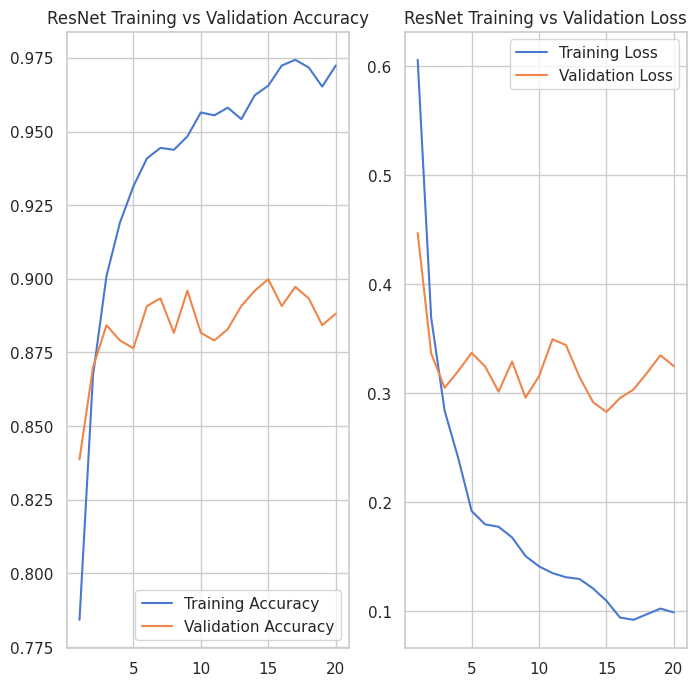

In [ ]:
# Extract accuracy and loss metrics from ResNet training history
resnet_training_accuracy = resnet_training_history.history['accuracy']
resnet_validation_accuracy = resnet_training_history.history['val_accuracy']
resnet_training_loss = resnet_training_history.history['loss']
resnet_validation_loss = resnet_training_history.history['val_loss']

# Define the range of epochs based on completed training
resnet_epoch_range = range(1, len(resnet_training_accuracy) + 1)

# Create a figure to visualize ResNet training metrics
plt.figure(figsize=(8, 8))

# Plot accuracy metrics for ResNet model
plt.subplot(1, 2, 1)
plt.plot(resnet_epoch_range, resnet_training_accuracy, label='Training Accuracy')
plt.plot(resnet_epoch_range, resnet_validation_accuracy, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('ResNet Training vs Validation Accuracy')

# Plot loss metrics for ResNet model
plt.subplot(1, 2, 2)
plt.plot(resnet_epoch_range, resnet_training_loss, label='Training Loss')
plt.plot(resnet_epoch_range, resnet_validation_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('ResNet Training vs Validation Loss')

# Display the visualization
plt.show()

In [ ]:
# Evaluate the ResNet model on the validation dataset
resnet_validation_loss, resnet_validation_accuracy = flower_resnet_classifier.evaluate(validation_dataset)
print("Validation Loss:", resnet_validation_loss)
print("Validation Accuracy:", resnet_validation_accuracy)

25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 121ms/step - accuracy: 0.8998 - loss: 0.2760
Validation Loss: 0.3248594105243683
Validation Accuracy: 0.8881664276123047


Found 430 files belonging to 5 classes.
14/14 ━━━━━━━━━━━━━━━━━━━━ 7s 473ms/step - accuracy: 0.9017 - loss: 0.3565
Test Loss: 0.35259804129600525
Test Accuracy: 0.8999999761581421
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


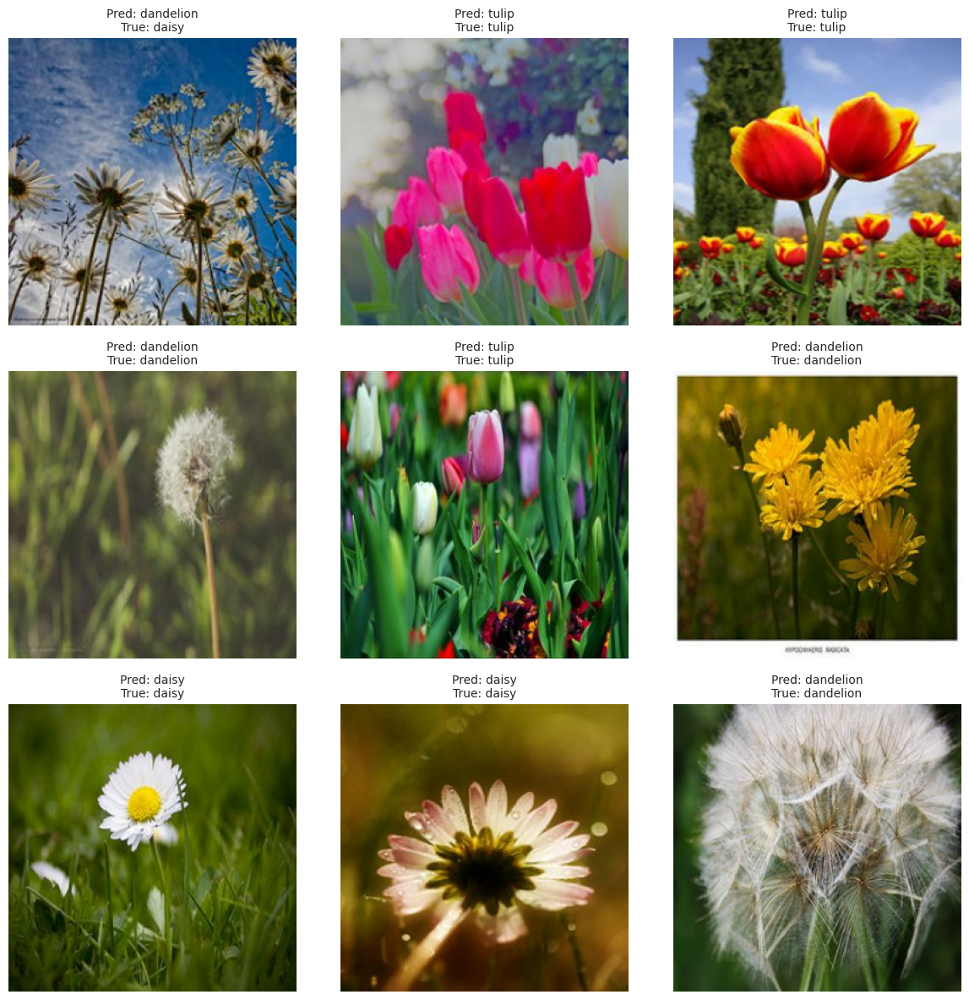

In [ ]:
# Define a function to visualize ResNet model predictions
def visualize_resnet_predictions(model, dataset, category_names):
    plt.figure(figsize=(12, 12))
    for images, labels in dataset.take(1):
        # Generate predictions for the image batch
        prediction_outputs = model.predict(images)
        image_data = images.numpy()  # Convert images to NumPy arrays
        label_data = labels.numpy()  # Convert labels to NumPy arrays

        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(image_data[i].astype("uint8"))

            # Determine the predicted category
            predicted_category = category_names[np.argmax(prediction_outputs[i])]

            # Extract the true category from one-hot encoded labels
            true_category_index = np.argmax(label_data[i])
            true_category = category_names[true_category_index]

            # Display predicted and true categories
            plt.title(f"Pred: {predicted_category}\nTrue: {true_category}", fontsize=10)
            plt.axis("off")

    plt.tight_layout()
    plt.show()

# Create test dataset from the specified directory
test_dataset_path = "/content/drive/MyDrive/AI Level 6/Flower Classification/Processed_Dataset/testing"
test_dataset = tf.keras.utils.image_dataset_from_directory(
    test_dataset_path,
    batch_size=32,
    image_size=(256, 256),
    shuffle=True
)

# Convert test dataset labels to one-hot encoded format
test_dataset = test_dataset.map(lambda image, label: (image, tf.one_hot(label, depth=5)))

# Evaluate the ResNet model on the test dataset
resnet_test_loss, resnet_test_accuracy = flower_resnet_classifier.evaluate(test_dataset)
print("Test Loss:", resnet_test_loss)
print("Test Accuracy:", resnet_test_accuracy)

# Visualize predictions for a sample of test images
visualize_resnet_predictions(flower_resnet_classifier, test_dataset, class_names)


In [ ]:
# Save the ResNet-based model
flower_resnet_classifier.save('2329462_SabinShrestha_CNN_TRANSFERLEARNING.h5')

In [ ]:
# Load the saved ResNet model for predictions
loaded_resnet_classifier = keras.models.load_model('2329462_SabinShrestha_CNN_TRANSFERLEARNING.h5')
print("Transfer learning model loaded for predictions")

# Gather all test images and labels
test_image_collection = []
test_label_collection = []
for images, labels in test_dataset:
    test_image_collection.append(images.numpy())
    test_label_collection.append(labels.numpy())

# Combine batches into unified arrays
combined_test_images = np.concatenate(test_image_collection, axis=0)
combined_test_labels_onehot = np.concatenate(test_label_collection, axis=0)

# Generate predictions using the loaded model
resnet_predictions = loaded_resnet_classifier.predict(combined_test_images)
resnet_predicted_indices = np.argmax(resnet_predictions, axis=1)
resnet_true_indices = combined_test_labels_onehot
if resnet_true_indices.ndim > 1:
    resnet_true_indices = np.argmax(resnet_true_indices, axis=1)

# Display the list of category names
print(f"Category names: {class_names}")

# Produce and display the classification performance report
resnet_classification_metrics = classification_report(resnet_true_indices, resnet_predicted_indices, target_names=class_names)
print("Classification Performance Report:\n", resnet_classification_metrics)

Transfer learning model loaded for predictions
14/14 ━━━━━━━━━━━━━━━━━━━━ 9s 458ms/step
Category names: ['daisy', 'dandelion', 'rose', 'sunflower', 'tulip']
Classification Performance Report:
               precision    recall  f1-score   support

       daisy       0.86      0.89      0.88        76
   dandelion       0.90      0.89      0.89       105
        rose       0.89      0.91      0.90        78
   sunflower       0.96      0.93      0.94        73
       tulip       0.90      0.89      0.89        98

    accuracy                           0.90       430
   macro avg       0.90      0.90      0.90       430
weighted avg       0.90      0.90      0.90       430

